In [ ]:
## BTK DATATHON 23

In [13]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go 
import plotly.express as px


from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,QuantileTransformer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import StratifiedKFold


from imblearn.pipeline import Pipeline as FullPipeline


#Tüm denenen modeller Pipeline içerisinde Model (as Model) olarak kullanılmıştır. En Son Lightgbm algoritması kullanılmıştır.

from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier as Model


In [14]:
data=pd.read_csv("train.csv")
data.head(4)

,index,Cinsiyet,Yaş Grubu,Medeni Durum,Eğitim Düzeyi,İstihdam Durumu,Yıllık Ortalama Gelir,Yaşadığı Şehir,En Çok İlgilendiği Ürün Grubu,Yıllık Ortalama Satın Alım Miktarı,Yıllık Ortalama Sipariş Verilen Ürün Adedi,Eğitime Devam Etme Durumu,Öbek İsmi,Yıllık Ortalama Sepete Atılan Ürün Adedi
0,0,Kadın,31-40,Bekar,Yüksek Lisans Mezunu,Düzenli ve Ücretli Bir İşi Var,748266.440879,Büyük Şehir,Elektronik ve Teknolojik Ürünler,32010.900881,37.310644,Etmiyor,obek_4,102.936904
1,1,Erkek,>60,Evli,Lise Mezunu,Kendi İşinin Sahibi,246298.609605,Küçük Şehir,Spor Malzemeleri,4145.729891,11.554851,Etmiyor,obek_5,82.176053
2,2,Erkek,18-30,Bekar,Lise Mezunu,Düzenli ve Ücretli Bir İşi Var,268582.732360,Küçük Şehir,Giyim,9924.379414,55.353236,Ediyor,obek_8,141.661426
3,3,Erkek,51-60,Evli,Lise Mezunu,Kendi İşinin Sahibi,327721.837865,Kırsal,Giyim,6417.780714,15.417239,Etmiyor,obek_3,17.097397


In [15]:
#Kaç tane verimiz olduğuna bakma
data.shape

(5460, 14)

In [16]:
#boş sutunlara bakma
data.isnull().sum()

index                                         0
Cinsiyet                                      0
Yaş Grubu                                     0
Medeni Durum                                  0
Eğitim Düzeyi                                 0
İstihdam Durumu                               0
Yıllık Ortalama Gelir                         0
Yaşadığı Şehir                                0
En Çok İlgilendiği Ürün Grubu                 0
Yıllık Ortalama Satın Alım Miktarı            0
Yıllık Ortalama Sipariş Verilen Ürün Adedi    0
Eğitime Devam Etme Durumu                     0
Öbek İsmi                                     0
Yıllık Ortalama Sepete Atılan Ürün Adedi      0
dtype: int64

In [17]:
#Kolon tiplerine bakma
data.dtypes

index                                           int64
Cinsiyet                                       object
Yaş Grubu                                      object
Medeni Durum                                   object
Eğitim Düzeyi                                  object
İstihdam Durumu                                object
Yıllık Ortalama Gelir                         float64
Yaşadığı Şehir                                 object
En Çok İlgilendiği Ürün Grubu                  object
Yıllık Ortalama Satın Alım Miktarı            float64
Yıllık Ortalama Sipariş Verilen Ürün Adedi    float64
Eğitime Devam Etme Durumu                      object
Öbek İsmi                                      object
Yıllık Ortalama Sepete Atılan Ürün Adedi      float64
dtype: object

In [18]:
# Kategorik kolonları belirleme
cat_sutun= [sutun for sutun in data.columns if data[sutun].dtype == 'object']
cat_sutun

['Cinsiyet',
 'Yaş Grubu',
 'Medeni Durum',
 'Eğitim Düzeyi',
 'İstihdam Durumu',
 'Yaşadığı Şehir',
 'En Çok İlgilendiği Ürün Grubu',
 'Eğitime Devam Etme Durumu',
 'Öbek İsmi']

In [19]:
#Numeric kolonları belirleme
num_sutun=[sutun for sutun in data.columns if data[sutun].dtype !='object']
num_sutun

['index',
 'Yıllık Ortalama Gelir',
 'Yıllık Ortalama Satın Alım Miktarı',
 'Yıllık Ortalama Sipariş Verilen Ürün Adedi',
 'Yıllık Ortalama Sepete Atılan Ürün Adedi']

In [20]:
data.describe()

,index,Yıllık Ortalama Gelir,Yıllık Ortalama Satın Alım Miktarı,Yıllık Ortalama Sipariş Verilen Ürün Adedi,Yıllık Ortalama Sepete Atılan Ürün Adedi
count,5460.000000,5.460000e+03,5460.000000,5460.000000,5460.000000
mean,2729.500000,3.635711e+05,16616.612217,24.040884,73.445693
std,1576.310566,2.197144e+05,14099.171704,14.945655,47.214184
min,0.000000,4.392299e+04,2859.254000,0.000000,3.977559
25%,1364.750000,2.156934e+05,4931.859057,11.550502,25.009168
50%,2729.500000,2.869254e+05,8426.818967,20.095924,82.485579
75%,4094.250000,4.681882e+05,30579.244695,35.918161,104.473291
max,5459.000000,1.192437e+06,48605.594415,64.616196,242.308441


## Burada bazı kolonlar için fikrimizin oluşması gerekiyor.

## Feature Type: 
### * Continuous
### * Categorical 

#### continuous:
* Yıllık Ortalama Gelir
* Yıllık Ortalama Satın Alım Miktarı
* Yıllık Ortalama Sipariş Verilen Ürün Adedi
* Yıllık Ortalama Sepete Atılan Ürün Adedi

#### Categorical:
* Cinsiyet
* Medeni Durum
* Medeni Durum
* Eğitim Düzeyi
* İstihdam Durumu
* Yaşadığı Şehir'
* En Çok İlgilendiği Ürün Grubu
* Eğitime Devam Etme Durumu
* Öbek İsmi 

In [21]:
#Yer değiştirilecek kolon Obek ismi
obek_df=data.iloc[:,-2:-1]


#Çıkarılacak kolon:
#index
#Öbek İsmi

data=data.drop(columns=["index","Öbek İsmi"],axis=1)

#Ardından öbek ismini tekrar ekleyelim
data["Öbek İsmi"]=obek_df
data.sample(2)

,Cinsiyet,Yaş Grubu,Medeni Durum,Eğitim Düzeyi,İstihdam Durumu,Yıllık Ortalama Gelir,Yaşadığı Şehir,En Çok İlgilendiği Ürün Grubu,Yıllık Ortalama Satın Alım Miktarı,Yıllık Ortalama Sipariş Verilen Ürün Adedi,Eğitime Devam Etme Durumu,Yıllık Ortalama Sepete Atılan Ürün Adedi,Öbek İsmi
3998,Kadın,18-30,Bekar,Üniversite Mezunu,İşsiz veya Düzenli Bir İşi Yok,325932.238540,Büyük Şehir,Kozmetik,9337.392483,49.705319,Ediyor,151.000401,obek_8
4938,Erkek,31-40,Evli,Eğitimsiz,Düzenli ve Ücretli Bir İşi Var,366563.454814,Büyük Şehir,Spor Malzemeleri,6487.501572,12.913757,Etmiyor,15.075229,obek_3


In [22]:
data.shape

(5460, 13)

In [23]:
#Test etme
#Yaş grubu normalde bir contionus kolon tipidir. Ancak burada görüldüğü üzere kategoriktir.
print(data["Yaş Grubu"].nunique()) 

5


In [24]:

abt_data_types={'Cinsiyet':"categorical",
 'Yaş Grubu':"categorical",
 'Medeni Durum':"categorical",
 'Eğitim Düzeyi':"categorical",
 'İstihdam Durumu':"categorical",
 'Yaşadığı Şehir':"categorical",
 'En Çok İlgilendiği Ürün Grubu':"categorical",
 'Eğitime Devam Etme Durumu':"categorical",
 'Yıllık Ortalama Gelir':"continuous",
 'Yıllık Ortalama Satın Alım Miktarı':"continuous",
 'Yıllık Ortalama Sipariş Verilen Ürün Adedi':"continuous",
 'Yıllık Ortalama Sepete Atılan Ürün Adedi':"continuous",
 "Öbek İsmi":"categorical"
 
 }

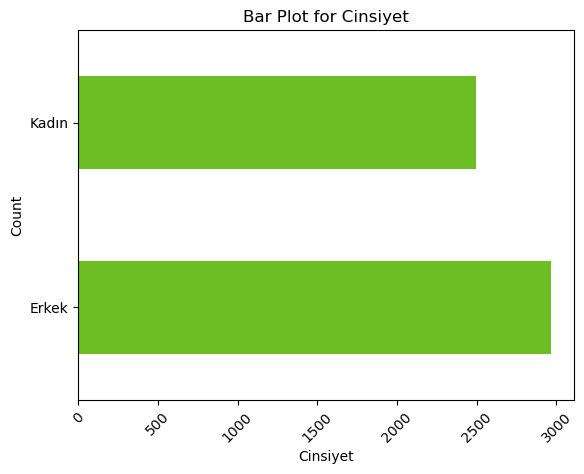

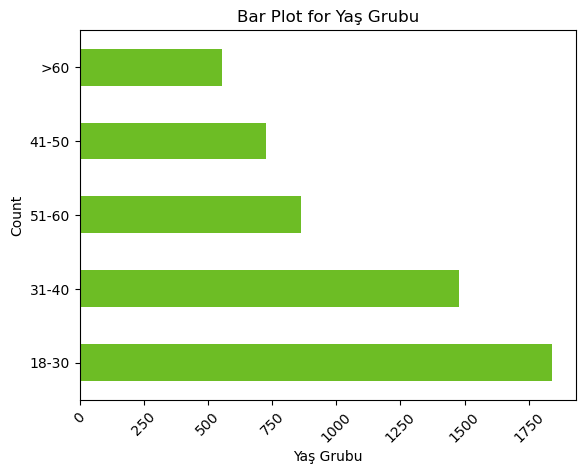

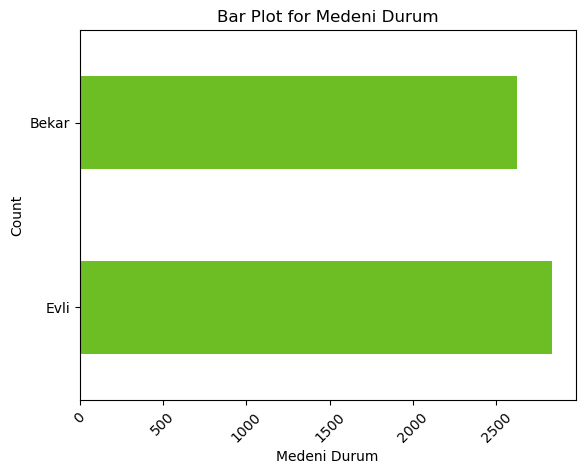

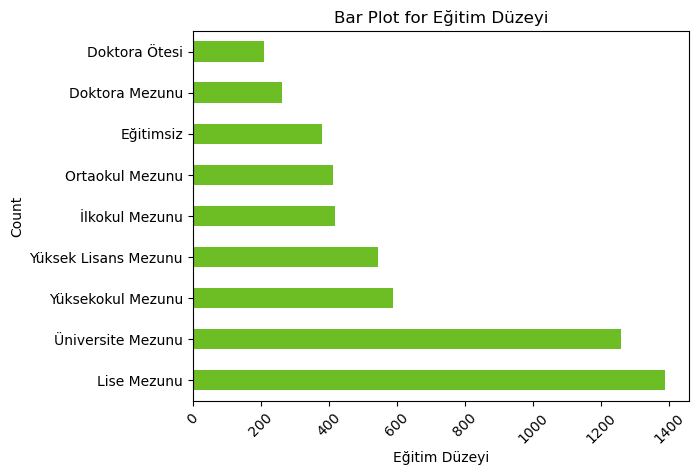

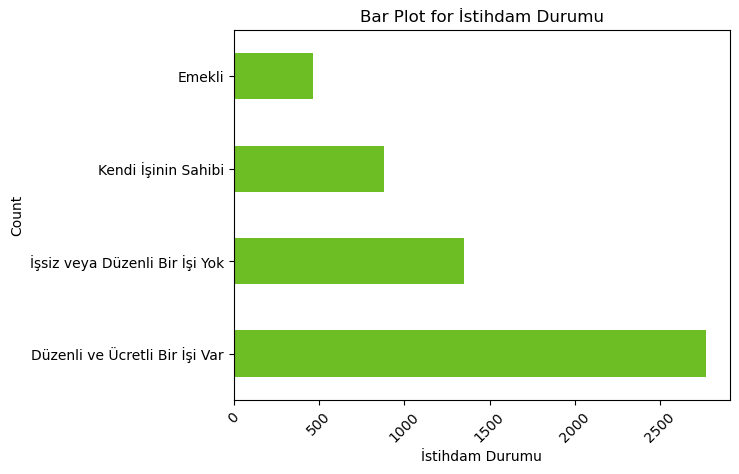

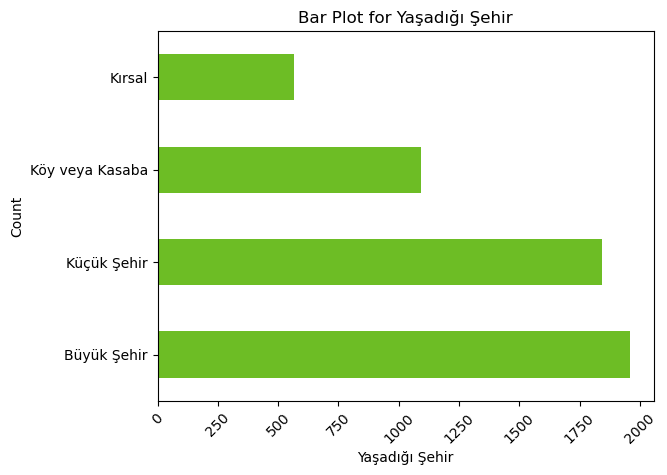

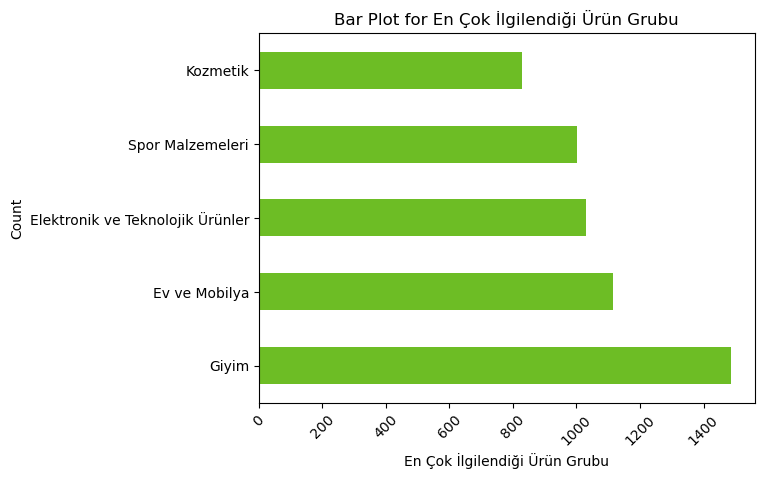

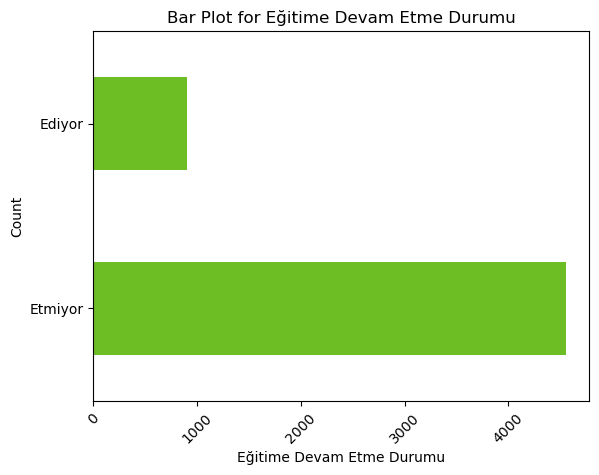

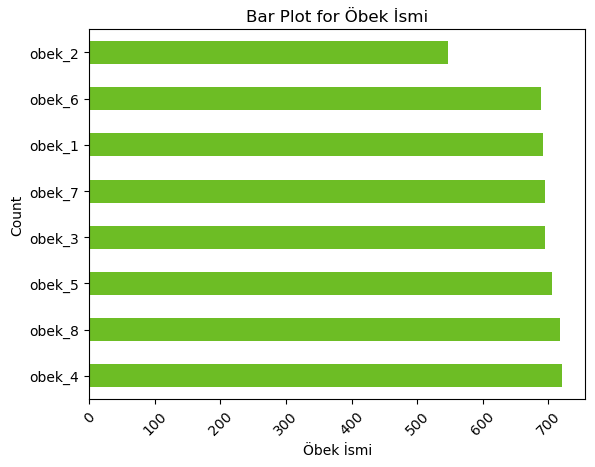

In [25]:
#Şimdi görselleştirelim

plot_color="#6DBD25"

for column,dtype in abt_data_types.items():
    if dtype=='categorical':
        plt.figure(num=f'{column}')
        data[column].value_counts().plot(kind='barh',color=plot_color)
        plt.title(f'Bar Plot for {column}')
        plt.xlabel(column)
        plt.ylabel('Count')


        plt.xticks(rotation=45)

        plt.show()

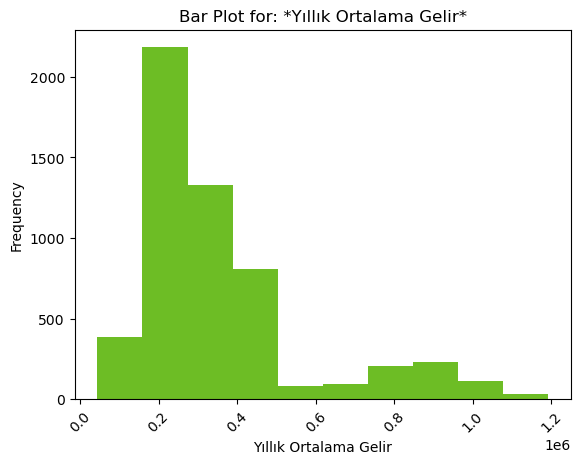

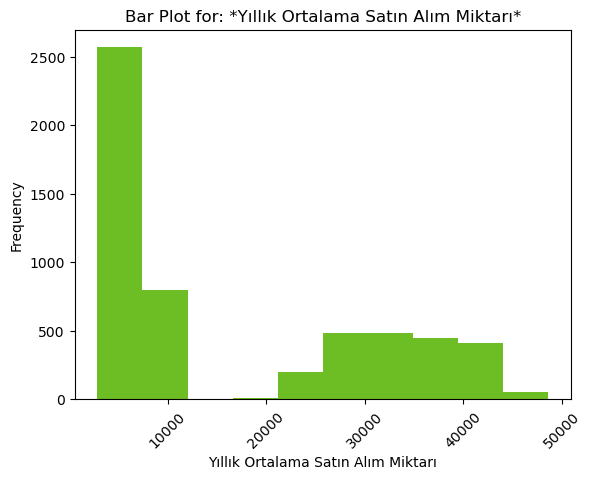

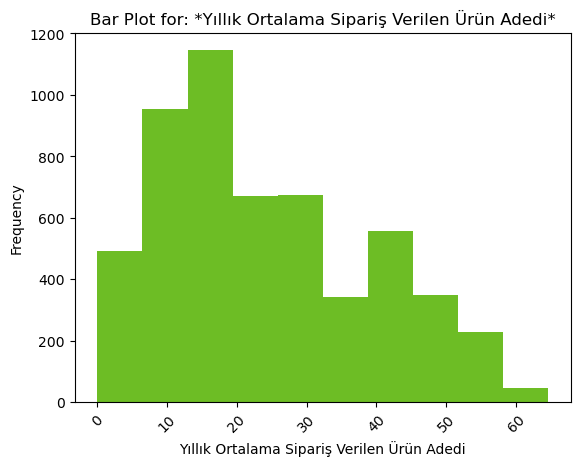

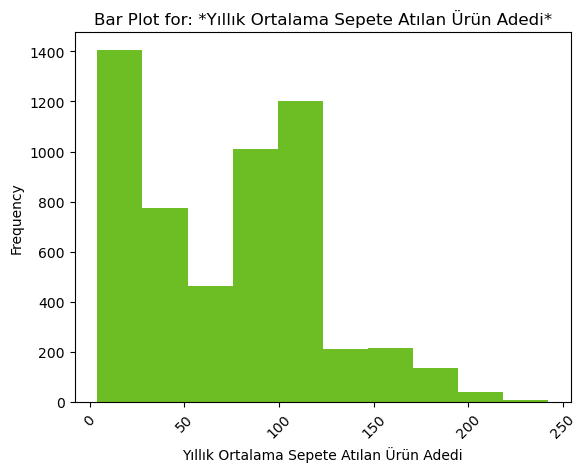

In [26]:
#Şimdi continuous columns için visualize edelim.
#continuous değerleri daha rahat görmek için histogramdan yararlanacağız.

for column, dtype in abt_data_types.items():

    if dtype=="continuous":
        plt.figure(num=f'* {column} *')  
        data[column].plot.hist(color=plot_color)
        plt.title(f'Bar Plot for: *{column}*')
        plt.xlabel(column)
        plt.ylabel('Frequency')
            
        plt.xticks(rotation=45)

        plt.show()

### Yorumlar:

Numeric için : 
* Grafiklerin right skew olduğu görülmektedir. Bunlar için ileride Transform uygulanacaklar.
    * İlgili yöntemler RobustScaler and QuantileScaler'dır.

## Bivariate analysis

In [27]:
cat_sutun = [
    "Cinsiyet",
    "Yaş Grubu",
    "Medeni Durum",
    "Eğitim Düzeyi",
    "İstihdam Durumu",
    "Yaşadığı Şehir",
    "En Çok İlgilendiği Ürün Grubu",
    "Eğitime Devam Etme Durumu",
    "Öbek İsmi"
]

num_sutun=['Yıllık Ortalama Gelir',
 'Yıllık Ortalama Satın Alım Miktarı',
 'Yıllık Ortalama Sipariş Verilen Ürün Adedi',
 'Yıllık Ortalama Sepete Atılan Ürün Adedi']

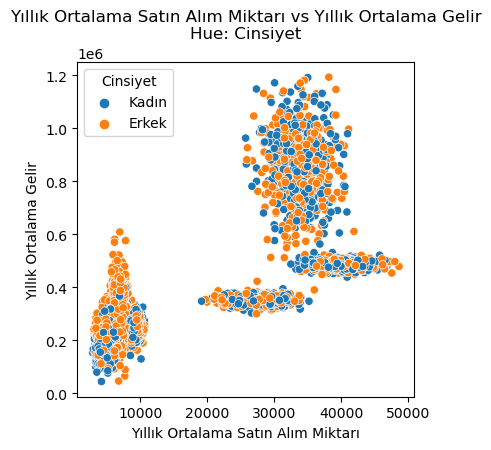

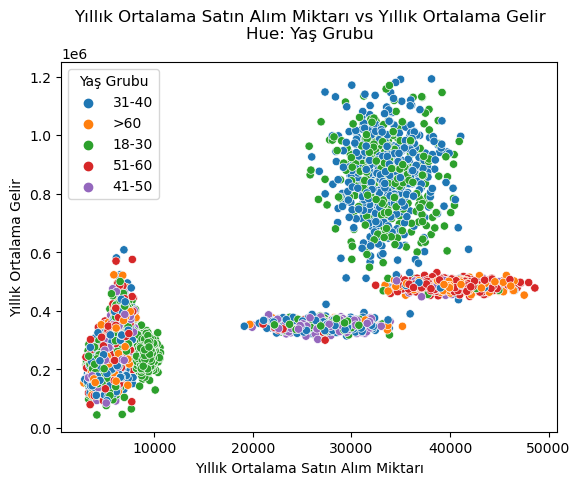

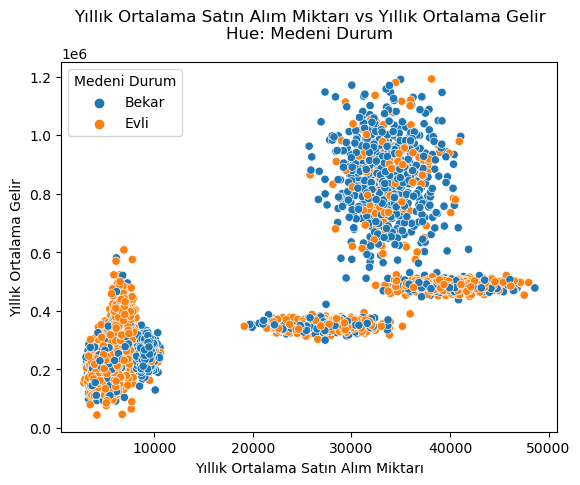

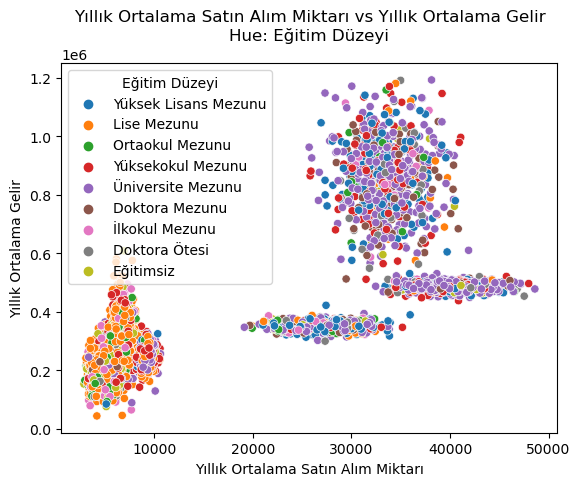

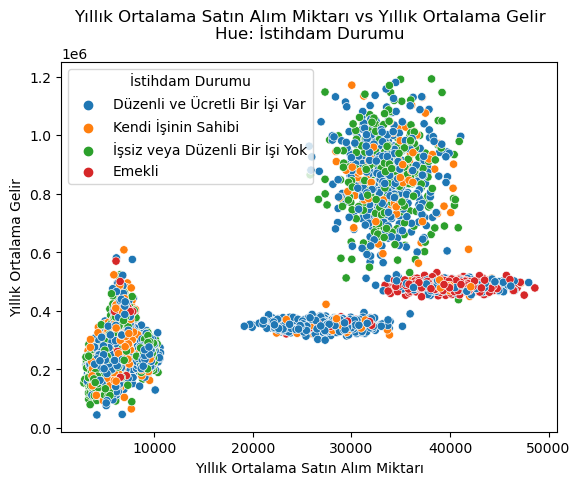

...

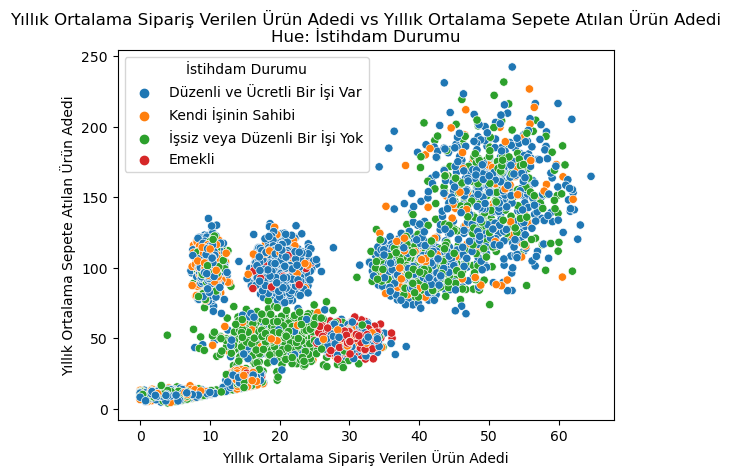

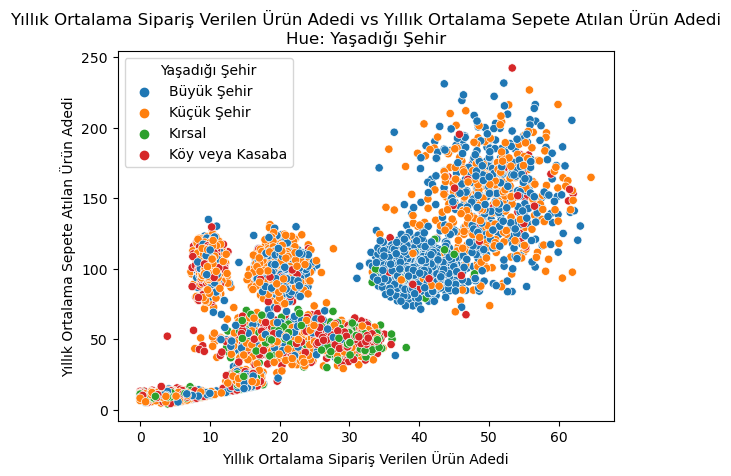

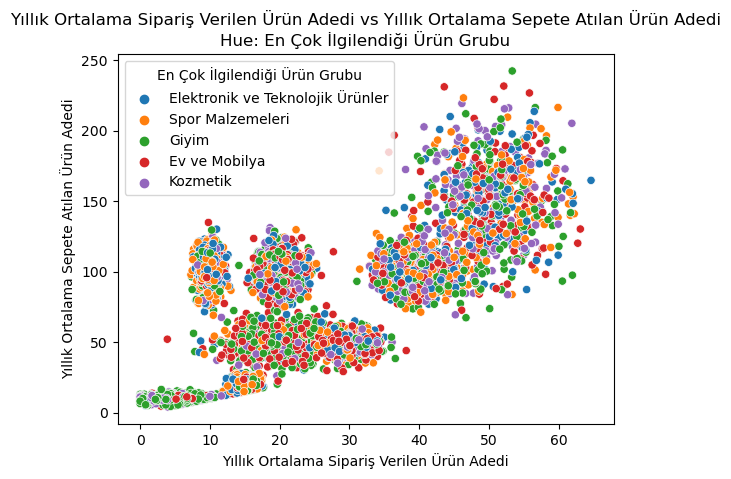

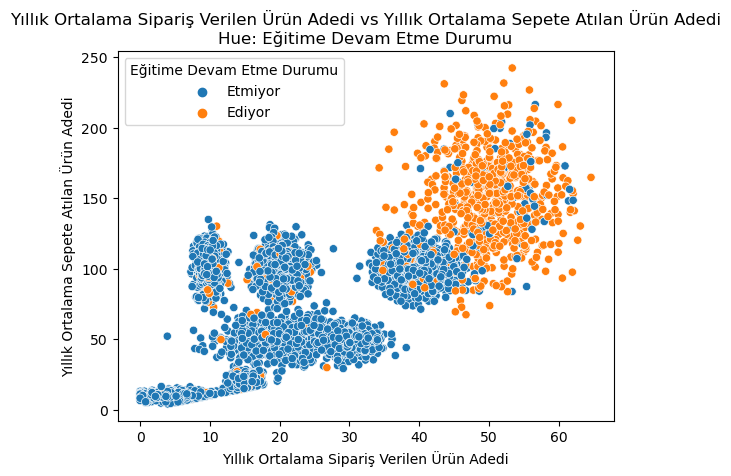

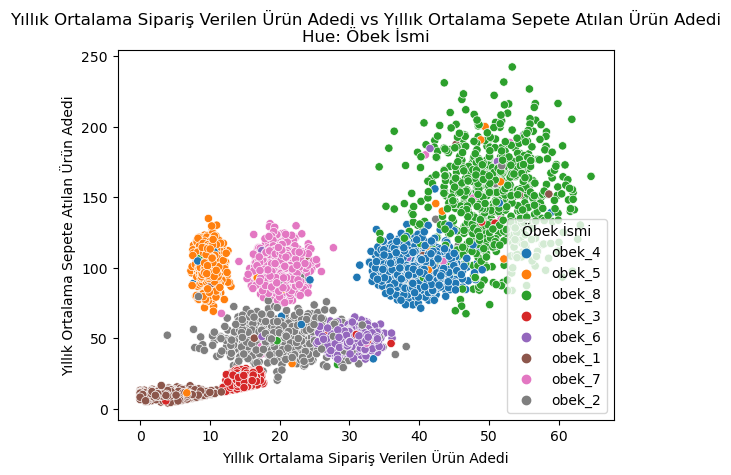

In [28]:

for p, y_column in enumerate(num_sutun, start=1):
    plt.figure(figsize=(20,20))
    plt.subplot(4, len(num_sutun), p)

    for x_column in num_sutun:
        for k in cat_sutun:
            if x_column != y_column:
                sns.scatterplot(x=data[x_column], y=data[y_column], hue=data[k])
                plt.title(f"{x_column} vs {y_column}\nHue: {k}")
                plt.xlabel(x_column)
                plt.ylabel(y_column)
                plt.show()
            else:
                continue

* ### Yorumlar : 


* Gözle görülür herhangi bir korelasyon bulunamamıştır.


Referans: 

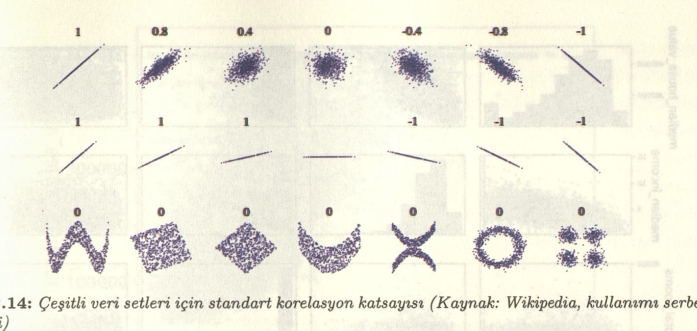

* Aşağıdaki kod bloğu Plotly kütüphanesi ile tüm kategorik kolonlar ile Nümerik kolonlar arasında ilişkiyi göstermektedir. Ancak tüm kolonlarla ilişkiyi gösterdiğinden oldukça çok detaylı grafik ortaya çıkacak. Ve bu da dosyanın MB arttıracaktır. Örnek olması adına bir grafiği aşağıya bırakıyorum.

In [29]:
# for p, x_column in enumerate(num_sutun, start=1):
#     for y_sutun in cat_sutun:
#         plt.figure(figsize=(20, 20))
#         fig = px.box(
#             data,
#             x=x_column,
#             y=y_sutun,
#             points="all",
#             color=y_sutun
#         )
#         fig.show()

## Obek'leri Gelir Düzeyleri


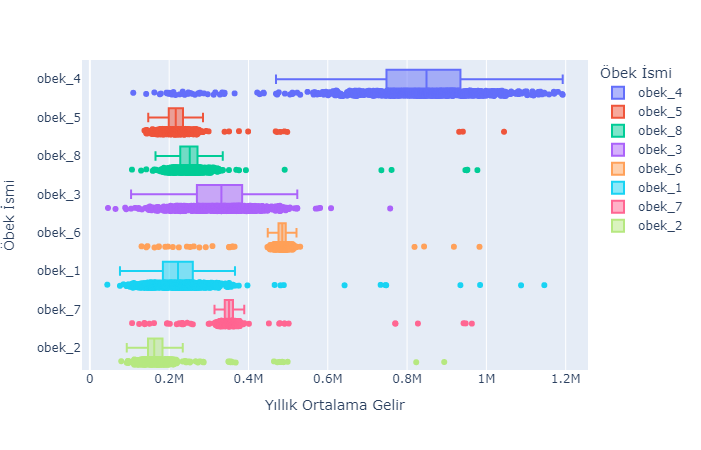


## Data Quality Report 

* Kitabı bir yaklaşım olup, veriyi daha iyi analiz etmeye olanak sağlar.

### For continious variables
* minimum

* 1st quartile

* mean

* median

* 3rd quartile

* maximum

* standard deviation

* total number of instances

* % of instances in ABT that are missing a value

* cardinality (# of unique values in that feature)

### For categorical variables
* mode 1 (most frequent value)

* raw frequency of mode 1

* % frequency of mode 1

* mode 2 (2nd most frequent value)

* raw frequency of mode 2

* % frequency of mode 2

* % of instances in ABT that are missing a value

* cardinality

In [30]:
def featureWise_dqr(a_series,feature,data_type,hassasiyet=2):

    """
    a_series: bir DataFrame
    data_type : continuous
    hassasiyet : round fonksiyonunnda kullandığımız hassasiyet değerimiz
    """

    report_dict = dict() #boş bir dict.
    report_dict["feature"]=feature


    #Contionus kolonlara sahip olanlar için

    if data_type == "continuous":
        print("continuous değerler hesaplanıyor ...")
        report_dict["missing_percent"] = round(len(a_series[a_series.isna()]) / len(a_series) * 100, hassasiyet) #bir kolondaki boş değerler
        report_dict["cardinality"] = a_series.nunique() #cardinality= bir kolondaki eşsiz verilen sayısıdır.
        report_dict["min"] = round(a_series.min(),hassasiyet)
        report_dict["1st_q"] = round(a_series.quantile([.25]).values[0],hassasiyet) #ilk çeyreklik
        report_dict["mean"] = round(a_series.mean(),hassasiyet)
        report_dict["median"] = round(a_series.median(),hassasiyet)
        report_dict["3rd_q"] = round(a_series.quantile([.75]).values[0],hassasiyet) #son çeyreklik
        report_dict["max"] = round(a_series.max(),hassasiyet)
        report_dict["std"] = round(a_series.std(),hassasiyet)

    #Şimdi geldik bi sonraki kolon tipimiz olan : categorical kolonlara 
    elif data_type == "categorical":
        print("categorical değerler hesaplanıyor ...")
        report_dict["missing_percent"] = round(len(a_series[a_series.isna()]) / len(a_series) * 100, hassasiyet)
        report_dict["cardinality"] = a_series.nunique()
        report_dict["mode1"] = a_series.mode().values[0] # en çok tekrar eden değer  
        report_dict["mode1_frequency_raw"]  = a_series.value_counts().iloc[0] #en çok tekrar eden değerin sıklığı
        report_dict["mode1_freq_perc"] = round((report_dict["mode1_frequency_raw"]/len(a_series)*100),hassasiyet) #en çok tekrar eden değerin yüzdesi

        report_dict["mode2"] = a_series.value_counts().index[1] #en çok tekrar eden 2. değer  
        report_dict["mode2_freq_raw"]  = a_series.value_counts().iloc[1] if report_dict["cardinality"] > 1 else np.nan  # en çok tekrar eden 2.değerin sıklığı
        report_dict["mode2_freq_perc"] = round((report_dict["mode2_freq_raw"]/len(a_series)*100),hassasiyet) #en çok tekrar eden 2. değerin yüzdesi

    
    #Son kolon tipimiz olan text kolonlarımıza:
    elif data_type == "text":
        token_counts = [len(x.split()) if type(x) is str else 0 for x in a_series] # kelime sayısı (boşluklarla ayırıyoruz.)
        char_counts = [len(x) if type(x) is str else 0 for x in a_series] #karakter sayısı 

        report_dict["missing_percent"] = round(sum(1 for value in char_counts if value < 2) / len(a_series) * 100, hassasiyet) 
        report_dict["mean_tok_count"]    = round(np.mean(token_counts), hassasiyet) #ortalama kelime sayısı
        report_dict["mean_char_count"]    = round(np.mean(char_counts), hassasiyet) #ortalama karakter sayısı
        report_dict["std_token_count"]    = round(np.std(token_counts), hassasiyet) #kelime sayısının standart sapması
        report_dict["std_char_count"]    = round(np.std(char_counts), hassasiyet) #karakter sayısının standart sapması
        report_dict["max_tok_count"]    = round(np.max(token_counts), hassasiyet) # en çok kullanılan kelime sayısı
        report_dict["max_char_count"]    = round(np.max(char_counts), hassasiyet) # en çok kullanılan karakter sayısı


        report_dict["tok_count_1st_q"]  = np.quantile(token_counts, 0.25) 
        report_dict["tok_count_2nd_q"]  = np.quantile(token_counts, 0.5)
        report_dict["tok_count_3nd_q"]  = np.quantile(token_counts, 0.75)

    return report_dict

In [31]:
#Şimdi yukarıdaki DataFrame çevirmek için fonksiyon yazalım.

def df_wise_dqr(a_df,abt_data_types):

    """Hesaplamaya çalıştığımız Data Quality Report'un bir DataFrame'e çevirişmiş halidir.."""

    #Boş listler oluşturma.
    categorical_dqr= list()
    continious_dqr = list()
    texts_dqr = list()

    for feature, data_type in abt_data_types.items():
        dqr_of_feature=featureWise_dqr(a_df[feature],feature,data_type)

        if data_type == "categorical":
            categorical_dqr.append(dqr_of_feature)
            
        
        elif data_type == "continuous":
            continious_dqr.append(dqr_of_feature)
            
        elif data_type == "text":
            texts_dqr.append(dqr_of_feature)
            

        
    return {"categorical": pd.DataFrame(categorical_dqr),
                "continuous": pd.DataFrame(continious_dqr),
                "text": pd.DataFrame(texts_dqr)}

In [32]:
data_Quality_report= df_wise_dqr(data,abt_data_types)


categorical değerler hesaplanıyor ...
categorical değerler hesaplanıyor ...
categorical değerler hesaplanıyor ...
categorical değerler hesaplanıyor ...
categorical değerler hesaplanıyor ...
categorical değerler hesaplanıyor ...
categorical değerler hesaplanıyor ...
categorical değerler hesaplanıyor ...
continuous değerler hesaplanıyor ...
continuous değerler hesaplanıyor ...
continuous değerler hesaplanıyor ...
continuous değerler hesaplanıyor ...
categorical değerler hesaplanıyor ...


In [33]:
data_Quality_report["categorical"]

,feature,missing_percent,cardinality,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,0.0,2,Erkek,2964,54.29,Kadın,2496,45.71
1,Yaş Grubu,0.0,5,18-30,1841,33.72,31-40,1477,27.05
2,Medeni Durum,0.0,2,Evli,2834,51.90,Bekar,2626,48.10
3,Eğitim Düzeyi,0.0,9,Lise Mezunu,1388,25.42,Üniversite Mezunu,1257,23.02
4,İstihdam Durumu,0.0,4,Düzenli ve Ücretli Bir İşi Var,2768,50.70,İşsiz veya Düzenli Bir İşi Yok,1349,24.71
5,Yaşadığı Şehir,0.0,4,Büyük Şehir,1959,35.88,Küçük Şehir,1842,33.74
6,En Çok İlgilendiği Ürün Grubu,0.0,5,Giyim,1487,27.23,Ev ve Mobilya,1114,20.40
7,Eğitime Devam Etme Durumu,0.0,2,Etmiyor,4554,83.41,Ediyor,906,16.59
8,Öbek İsmi,0.0,8,obek_4,720,13.19,obek_8,717,13.13


In [34]:
data_continuous=data_Quality_report["continuous"]
data_continuous

,feature,missing_percent,cardinality,min,1st_q,mean,median,3rd_q,max,std
0,Yıllık Ortalama Gelir,0.0,5460,43922.99,215693.44,363571.13,286925.44,468188.22,1192437.15,219714.44
1,Yıllık Ortalama Satın Alım Miktarı,0.0,5460,2859.25,4931.86,16616.61,8426.82,30579.24,48605.59,14099.17
2,Yıllık Ortalama Sipariş Verilen Ürün Adedi,0.0,5422,0.00,11.55,24.04,20.10,35.92,64.62,14.95
3,Yıllık Ortalama Sepete Atılan Ürün Adedi,0.0,5460,3.98,25.01,73.45,82.49,104.47,242.31,47.21


## Öbekleri inceleme

Şimdi bu Data Quality Report'u Obeklere uygulayalım..

In [35]:
#Yukarıdaki yazdığımız kodu güncelleyelim.. Ve sadece öbeklere odaklanalım..


def Obekleri_İnceleme(data, obek_adı):
    obek_df = data[data["Öbek İsmi"] == obek_adı]
    
    report_dict = {"feature": [], "mode1": [], "mode1_frequency_raw": [], "mode1_freq_perc": [], "mode2": [], "mode2_freq_raw": [], "mode2_freq_perc": []}
    
    for column in obek_df.columns:
        if column == "Öbek İsmi":
            continue
        
        a_series = obek_df[column]
        
        mode1_value = a_series.mode().values[0]
        mode1_frequency = a_series.value_counts().iloc[0]
        mode1_freq_perc = round((mode1_frequency / len(a_series)) * 100, 2)
        
        mode2_value = a_series.value_counts().index[1] if len(a_series.value_counts()) > 1 else np.nan
        mode2_frequency = a_series.value_counts().iloc[1] if len(a_series.value_counts()) > 1 else np.nan
        mode2_freq_perc = round((mode2_frequency / len(a_series)) * 100, 2) if not np.isnan(mode2_frequency) else np.nan
        
        report_dict["feature"].append(column)
        report_dict["mode1"].append(mode1_value)
        report_dict["mode1_frequency_raw"].append(mode1_frequency)
        report_dict["mode1_freq_perc"].append(mode1_freq_perc)
        report_dict["mode2"].append(mode2_value)
        report_dict["mode2_freq_raw"].append(mode2_frequency)
        report_dict["mode2_freq_perc"].append(mode2_freq_perc)
    
    report_df = pd.DataFrame(report_dict)
    return report_df

#Deneme
report_df = Obekleri_İnceleme(data, "obek_8")
report_df

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Kadın,360,50.21,Erkek,357,49.79
1,Yaş Grubu,18-30,697,97.21,31-40,10,1.39
2,Medeni Durum,Bekar,636,88.70,Evli,81,11.30
3,Eğitim Düzeyi,Yüksekokul Mezunu,221,30.82,Üniversite Mezunu,221,30.82
4,İstihdam Durumu,Düzenli ve Ücretli Bir İşi Var,419,58.44,İşsiz veya Düzenli Bir İşi Yok,220,30.68
5,Yıllık Ortalama Gelir,106170.326877,1,0.14,261953.22257,1,0.14
6,Yaşadığı Şehir,Büyük Şehir,364,50.77,Küçük Şehir,311,43.38
7,En Çok İlgilendiği Ürün Grubu,Giyim,156,21.76,Ev ve Mobilya,152,21.20
8,Yıllık Ortalama Satın Alım Miktarı,3655.422769,1,0.14,8842.037179,1,0.14
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,0.0,1,0.14,54.33521,1,0.14


In [36]:
report_df_1 = Obekleri_İnceleme(data, "obek_1")
report_df_1

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Kadın,366,52.89,Erkek,326,47.11
1,Yaş Grubu,18-30,174,25.14,41-50,169,24.42
2,Medeni Durum,Evli,404,58.38,Bekar,288,41.62
3,Eğitim Düzeyi,Eğitimsiz,142,20.52,Lise Mezunu,134,19.36
4,İstihdam Durumu,Düzenli ve Ücretli Bir İşi Var,357,51.59,İşsiz veya Düzenli Bir İşi Yok,205,29.62
5,Yıllık Ortalama Gelir,43922.988693,1,0.14,266018.992339,1,0.14
6,Yaşadığı Şehir,Küçük Şehir,258,37.28,Köy veya Kasaba,171,24.71
7,En Çok İlgilendiği Ürün Grubu,Giyim,435,62.86,Kozmetik,176,25.43
8,Yıllık Ortalama Satın Alım Miktarı,3522.60651,1,0.14,6535.083484,1,0.14
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,0.0,38,5.49,2.542251,1,0.14


In [37]:
report_df_2 = Obekleri_İnceleme(data, "obek_2")
report_df_2

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Kadın,528,96.53,Erkek,19,3.47
1,Yaş Grubu,18-30,134,24.50,41-50,109,19.93
2,Medeni Durum,Evli,424,77.51,Bekar,123,22.49
3,Eğitim Düzeyi,İlkokul Mezunu,121,22.12,Ortaokul Mezunu,108,19.74
4,İstihdam Durumu,İşsiz veya Düzenli Bir İşi Yok,417,76.23,Düzenli ve Ücretli Bir İşi Var,97,17.73
5,Yıllık Ortalama Gelir,79099.869042,1,0.18,216986.001704,1,0.18
6,Yaşadığı Şehir,Küçük Şehir,203,37.11,Köy veya Kasaba,118,21.57
7,En Çok İlgilendiği Ürün Grubu,Giyim,221,40.40,Ev ve Mobilya,211,38.57
8,Yıllık Ortalama Satın Alım Miktarı,2859.254,1,0.18,4146.976163,1,0.18
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,1.578607,1,0.18,14.821709,1,0.18


In [38]:
report_df_3 = Obekleri_İnceleme(data, "obek_3")
report_df_3

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Erkek,626,90.07,Kadın,69,9.93
1,Yaş Grubu,51-60,153,22.01,31-40,148,21.29
2,Medeni Durum,Evli,562,80.86,Bekar,133,19.14
3,Eğitim Düzeyi,Lise Mezunu,361,51.94,Yüksekokul Mezunu,81,11.65
4,İstihdam Durumu,Düzenli ve Ücretli Bir İşi Var,281,40.43,Kendi İşinin Sahibi,225,32.37
5,Yıllık Ortalama Gelir,45695.091498,1,0.14,354914.762264,1,0.14
6,Yaşadığı Şehir,Küçük Şehir,271,38.99,Büyük Şehir,215,30.94
7,En Çok İlgilendiği Ürün Grubu,Spor Malzemeleri,205,29.50,Elektronik ve Teknolojik Ürünler,202,29.06
8,Yıllık Ortalama Satın Alım Miktarı,3636.706474,1,0.14,6839.478246,1,0.14
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,3.683875,1,0.14,13.571524,1,0.14


In [39]:
report_df_4 = Obekleri_İnceleme(data, "obek_4")
report_df_4

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Erkek,368,51.11,Kadın,352,48.89
1,Yaş Grubu,31-40,412,57.22,18-30,292,40.56
2,Medeni Durum,Bekar,556,77.22,Evli,164,22.78
3,Eğitim Düzeyi,Üniversite Mezunu,280,38.89,Yüksek Lisans Mezunu,125,17.36
4,İstihdam Durumu,Düzenli ve Ücretli Bir İşi Var,363,50.42,İşsiz veya Düzenli Bir İşi Yok,252,35.00
5,Yıllık Ortalama Gelir,109362.778379,1,0.14,179077.571807,1,0.14
6,Yaşadığı Şehir,Büyük Şehir,609,84.58,Küçük Şehir,43,5.97
7,En Çok İlgilendiği Ürün Grubu,Giyim,156,21.67,Spor Malzemeleri,153,21.25
8,Yıllık Ortalama Satın Alım Miktarı,3522.977246,1,0.14,4636.44761,1,0.14
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,1.229613,1,0.14,20.269022,1,0.14


In [40]:
report_df_5 = Obekleri_İnceleme(data, "obek_5")
report_df_5

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Erkek,576,81.59,Kadın,130,18.41
1,Yaş Grubu,31-40,350,49.58,18-30,251,35.55
2,Medeni Durum,Bekar,397,56.23,Evli,309,43.77
3,Eğitim Düzeyi,Lise Mezunu,534,75.64,Doktora Mezunu,34,4.82
4,İstihdam Durumu,Düzenli ve Ücretli Bir İşi Var,428,60.62,Kendi İşinin Sahibi,156,22.10
5,Yıllık Ortalama Gelir,137702.279861,1,0.14,233297.486847,1,0.14
6,Yaşadığı Şehir,Küçük Şehir,348,49.29,Köy veya Kasaba,224,31.73
7,En Çok İlgilendiği Ürün Grubu,Elektronik ve Teknolojik Ürünler,247,34.99,Spor Malzemeleri,225,31.87
8,Yıllık Ortalama Satın Alım Miktarı,3060.644111,1,0.14,4030.252173,1,0.14
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,3.004199,1,0.14,8.511535,1,0.14


In [41]:
report_df_6 = Obekleri_İnceleme(data, "obek_6")
report_df_6

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Erkek,344,50.00,Erkek,344,50.00
1,Yaş Grubu,51-60,390,56.69,>60,204,29.65
2,Medeni Durum,Evli,460,66.86,Bekar,228,33.14
3,Eğitim Düzeyi,Üniversite Mezunu,414,60.17,Yüksekokul Mezunu,67,9.74
4,İstihdam Durumu,Emekli,347,50.44,Düzenli ve Ücretli Bir İşi Var,247,35.90
5,Yıllık Ortalama Gelir,130268.743277,1,0.15,497717.386369,1,0.15
6,Yaşadığı Şehir,Köy veya Kasaba,330,47.97,Kırsal,224,32.56
7,En Çok İlgilendiği Ürün Grubu,Ev ve Mobilya,185,26.89,Spor Malzemeleri,139,20.20
8,Yıllık Ortalama Satın Alım Miktarı,3693.208322,1,0.15,43993.036778,1,0.15
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,4.502443,1,0.15,33.860384,1,0.15


In [42]:
report_df_7 = Obekleri_İnceleme(data, "obek_7")
report_df_7

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Erkek,348,50.07,Kadın,347,49.93
1,Yaş Grubu,31-40,259,37.27,41-50,231,33.24
2,Medeni Durum,Evli,430,61.87,Bekar,265,38.13
3,Eğitim Düzeyi,Üniversite Mezunu,218,31.37,Yüksek Lisans Mezunu,201,28.92
4,İstihdam Durumu,Düzenli ve Ücretli Bir İşi Var,576,82.88,Kendi İşinin Sahibi,78,11.22
5,Yıllık Ortalama Gelir,106393.116474,1,0.14,334646.521308,1,0.14
6,Yaşadığı Şehir,Büyük Şehir,343,49.35,Küçük Şehir,312,44.89
7,En Çok İlgilendiği Ürün Grubu,Ev ve Mobilya,189,27.19,Giyim,142,20.43
8,Yıllık Ortalama Satın Alım Miktarı,3909.393321,1,0.14,28180.385198,1,0.14
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,0.369584,1,0.14,18.436043,1,0.14


In [43]:
report_df_8 = Obekleri_İnceleme(data, "obek_8")
report_df_8

,feature,mode1,mode1_frequency_raw,mode1_freq_perc,mode2,mode2_freq_raw,mode2_freq_perc
0,Cinsiyet,Kadın,360,50.21,Erkek,357,49.79
1,Yaş Grubu,18-30,697,97.21,31-40,10,1.39
2,Medeni Durum,Bekar,636,88.70,Evli,81,11.30
3,Eğitim Düzeyi,Yüksekokul Mezunu,221,30.82,Üniversite Mezunu,221,30.82
4,İstihdam Durumu,Düzenli ve Ücretli Bir İşi Var,419,58.44,İşsiz veya Düzenli Bir İşi Yok,220,30.68
5,Yıllık Ortalama Gelir,106170.326877,1,0.14,261953.22257,1,0.14
6,Yaşadığı Şehir,Büyük Şehir,364,50.77,Küçük Şehir,311,43.38
7,En Çok İlgilendiği Ürün Grubu,Giyim,156,21.76,Ev ve Mobilya,152,21.20
8,Yıllık Ortalama Satın Alım Miktarı,3655.422769,1,0.14,8842.037179,1,0.14
9,Yıllık Ortalama Sipariş Verilen Ürün Adedi,0.0,1,0.14,54.33521,1,0.14


* #### Yorumlar: 

* Obek1--> Eğitim Yok(94)/ Giyim ve Kozmetik Düşkünü

* Obek2--> Kadın(96) / Eğitime Devam etmiyor/ Evli / işi de yok

* Obek3--> Erkek(90)/ Evli(80) / Genç Değil / Eğitim Yok

* Obek4--> Büyük Şehir / Eğitim Yok / 18-40 aralığında(97) / Bekar(77)

* Obek5--> Erkek (81) / Eğitim Yok /18-40 aralığında (87) / Lise Mezunu /82 iş sahibi oranı /80 köy kasaba küçük şehir

* Obek6--> Eğitim Yok / 51-60 / Kırsal Bölgeler 

* Obek7--> Üniversite/YüksekLisans Mezunu /Eğitim Yok /Düzenli ve Ücretli Bir İşi Var /

* Obek8--> Eğitim Var / 18-30 (97) / Bekar /

C:\Users\mete_\AppData\Local\Temp\ipykernel_12976\496229646.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True, cmap="RdBu")


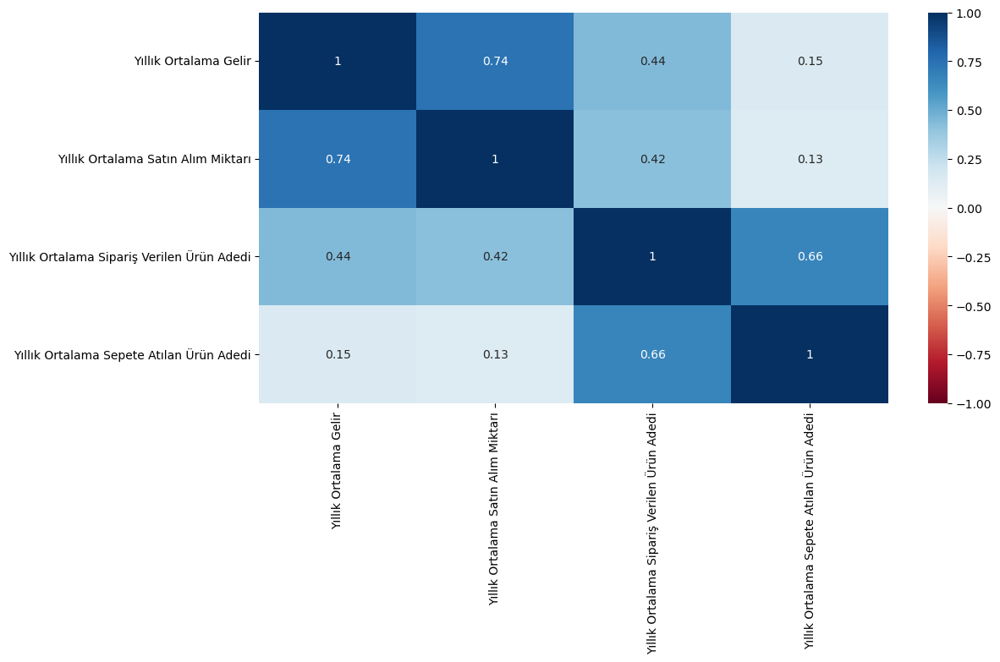

In [44]:
plt.figure(figsize=(12,6))
sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True, cmap="RdBu")
plt.show()

## Train-Test Split

### Transformation-One-Hot-Encoder İşlemleri


* Yukarıdaki skew'lar için; 

* Numeric kolonlar için : 

    * Quantile Transform uygulanacak.
    
    
 * Kategorik kolonlar için :
    * Cinsiyet --> 1/0 (binary)

    *  Yaş Grubu 
    
    * Eğitim durumu Önemli bir kolon bunu Seviyeye göre ayarlamamız lazım.. Ordinal Encoder veyahut apply methodu
    
    * İstidham durumun One-Hot Encoder
    
    * Yaşadığı Şehir One-Hot Encoder
    
    * En Çok İlgilendiği Ürün Grubu
    
    * Eğitime Devam Etme Durumu
    
 
    


### Kolonlar'la uğraşma

#### Numeric Colonlar

In [45]:


non_binary_sutunlar=["Yaş Grubu","İstihdam Durumu","En Çok İlgilendiği Ürün Grubu"]

num_sutunlar=["Yıllık Ortalama Gelir","Yıllık Ortalama Satın Alım Miktarı","Yıllık Ortalama Sipariş Verilen Ürün Adedi","Yıllık Ortalama Sepete Atılan Ürün Adedi"]

cat_sutun=["Yaşadığı Şehir","Eğitim Düzeyi","Cinsiyet","Medeni Durum"]

## Pipeline Oluşturma

In [46]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer,OrdinalEncoder
from sklearn.preprocessing import RobustScaler
from imblearn.pipeline import Pipeline as FullPipeline
from sklearn.model_selection import StratifiedKFold
from catboost import CatBoostClassifier
from  lightgbm import LGBMClassifier as Model

#Numeric sutunlar için
numeric_transformer= Pipeline(steps=[
    ('robust',RobustScaler()),
    ('scaler',QuantileTransformer())
    
])



#Non_binary sutunlar için 

# Get Dummies yerine de OneHotEncoder kullanımı doğrudur.
non_binary_transformer = Pipeline(steps=[
    ('non_binary', OneHotEncoder(handle_unknown='ignore'))
])

#Diğer categorik sutunlar için OrdinalEncoder kullanılacaktır.

cat_transformer= Pipeline(steps=[
    ('cat_ord',OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)) #unknown_value=kaç tane kategori varsa ona göre encode edebilmesi için -1

])


#Tüm bu Pipeline'ları ColumnTransformer altında birleştirelim..

pipelines=ColumnTransformer(transformers=[
    
    ("numeric",numeric_transformer,num_sutunlar),
    ("non_binary",non_binary_transformer,non_binary_sutunlar),
    ("cat_sutun",cat_transformer,cat_sutun)
])

ImportError: cannot import name 'OrdinalEncoder' from 'sklearn.compose' (c:\Users\mete_\anaconda3\envs\deeply\lib\site-packages\sklearn\compose\__init__.py)

In [ ]:
#Feature ile Target belirlenmesi

X=data.iloc[:,:-1]
y=data.iloc[:,-1:]

In [ ]:
np.random.seed(1)

from sklearn.model_selection import train_test_split,cross_val_score,StratifiedKFold

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.03, random_state=1)


In [ ]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((5296, 12), (164, 12), (5296, 1), (164, 1))

In [ ]:

from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()

y_train=le.fit_transform(y_train)

y_val=le.transform(y_val)

/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/conda/lib/python3.10/site-packages/sklearn/preprocessing/_label.py:134: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


In [ ]:
#Model Pipeline
model_pipeline = FullPipeline(steps=[
    ('preprocessing', pipelines),  # Burada pipelines yerine gerçek ön işleme adımınızı eklemelisiniz
    ('model', Model())
])

In [ ]:
#Cross-validation'ı ayarlamak
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=34)


cv_scores = cross_val_score(model_pipeline, X_train, y_train, cv=skf,
                            scoring="f1_macro")

for i, score in enumerate(cv_scores):
    print(f"Fold {i + 1} score: {score * 100:.2f}%")

print("---" * 8)
print(f"Ortalama F1-Skoru : {cv_scores.mean() * 100:.2f}%")
print(f"Standart Sapma: {cv_scores.std() * 100:.2f}%")

In [ ]:
model_pipeline.fit(X_train, y_train)
y_pred = model_pipeline.predict(X_val)

In [ ]:
def plot_confusion_matrix(confusion_matrix):    
    plt.figure(figsize = (12, 8))
    sns.heatmap(confusion_matrix,
                annot=True,
                fmt='d',
                cmap='Blues',
                linewidths=10,
                annot_kws={'size': 20}, cbar=False)

    plt.title('Confusion Matrix', size=18)
    plt.xlabel('Predicted Label', size=14)
    plt.ylabel('Actual Label', size=14)
    plt.show()

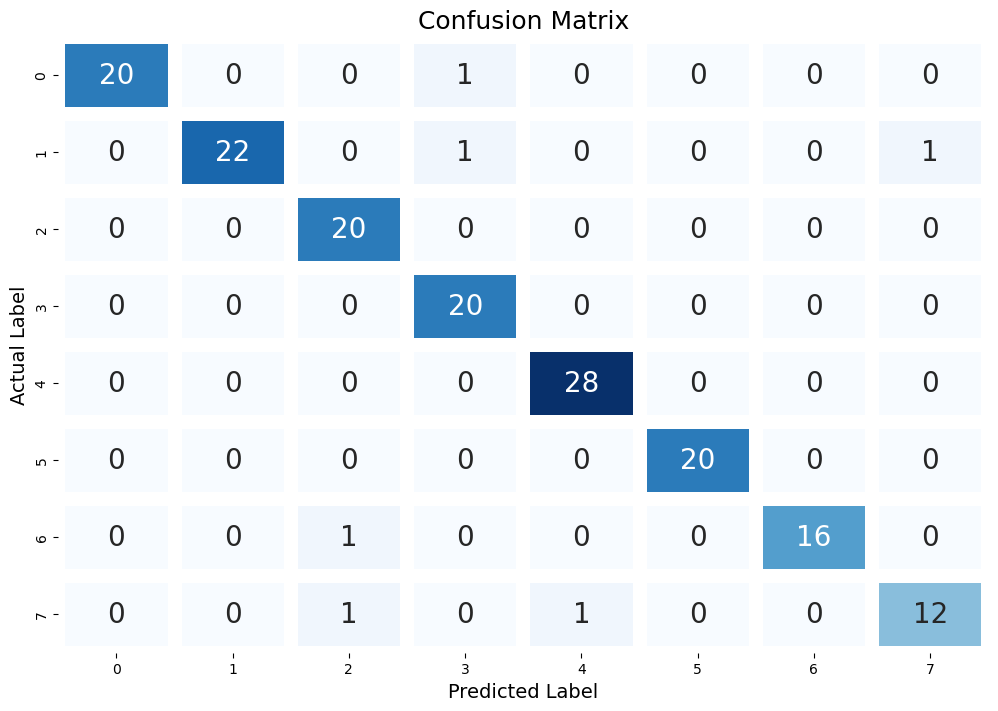

In [ ]:
#Confusion Matrix

from sklearn.metrics import confusion_matrix,classification_report

plot_confusion_matrix(confusion_matrix(y_val, y_pred))

In [ ]:
#Classification Report 
print(classification_report(y_val, y_pred))


#Recall- Precision Değerlerimizin yüksek çıkması bizim için önemli.

NameError: name 'classification_report' is not defined

## TEST VERİSİNİ TAHMİN ETME

In [ ]:
test_data = pd.read_csv("test_x.csv")

In [ ]:
test_data.head()
test_data.shape

(2340, 13)

In [ ]:
test_data.drop("index",axis=1,inplace=True)

In [ ]:
#Tahmin Yapma
predictions = model_pipeline.predict(test_data)

In [ ]:
predictions

array([2, 2, 1, ..., 6, 4, 5])

In [ ]:
le.classes_ #Sıralanışı bu şekilde herhalde!

array(['obek_1', 'obek_2', 'obek_3', 'obek_4', 'obek_5', 'obek_6',
       'obek_7', 'obek_8'], dtype=object)

In [ ]:
submission_df = pd.DataFrame(predictions, columns=["Öbek İsmi"])

In [ ]:
def Obek_belirleme(x):
    if   x==0:
        return "obek_1"
    elif x==1:
        return "obek_2"
    elif x==2:
        return "obek_3"
    elif x==3:
        return "obek_4"
    elif x==4:
        return "obek_5"
    elif x==5:
        return "obek_6"
    elif x==6:
        return "obek_7"
    elif x==7:
        return "obek_8"

In [ ]:
submission_df = submission_df.applymap(Obek_belirleme)

In [ ]:
submission_df

,Öbek İsmi
0,obek_3
1,obek_3
2,obek_2
3,obek_6
4,obek_1
...,...
2335,obek_8
2336,obek_2
2337,obek_7
2338,obek_5


In [ ]:
sub = pd.DataFrame()
sub["id"] = test_data.index
sub["Öbek İsmi"] = submission_df["Öbek İsmi"]
sub.to_csv("sub.csv",index=False)